# Question 3 Data Analysis Part

In [2]:
%matplotlib inline

import matplotlib.pyplot as plt
import requests
import json
import pandas as pd
import datetime as dt
import os
import numpy as np
import random
import warnings
import sklearn.linear_model as lm
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures as PF
from sklearn.metrics import r2_score,mean_absolute_error
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from matplotlib import mlab
from matplotlib import rcParams


warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
np.set_printoptions(threshold=np.inf)

**Availability curve of each area:**

In [3]:
july_div_area = pd.read_csv('july_div_area.csv')
july_div_area = july_div_area.drop(july_div_area.columns[0],axis=1)
aug_div_area = pd.read_csv('aug_div_area.csv')
aug_div_area = aug_div_area.drop(aug_div_area.columns[0],axis=1)

# empty df
average_area_july = pd.DataFrame()

# loop for the mean of each area
for id in july_div_area['area'].unique().astype(int):
    #print(id)
    average_area_july = pd.concat([average_area_july,july_div_area.loc[july_div_area['area'] == id].mean()],axis=1)
    
    
average_area_july = average_area_july.T.reset_index(drop=True)
display(average_area_july)

# empty df
average_area_aug = pd.DataFrame()

# loop for the mean of each area
for id in aug_div_area['area'].unique().astype(int):
    #print(id)
    average_area_aug = pd.concat([average_area_aug,aug_div_area.loc[aug_div_area['area'] == id].mean()],axis=1)
    
    
average_area_aug = average_area_aug.T.reset_index(drop=True)
display(average_area_aug)

area  2022_7_1_0_20_0  2022_7_1_1_20_0  2022_7_1_2_20_0  2022_7_1_3_20_0  \
0    10.0         0.378225         0.379620         0.371423         0.370247   
1    12.0         0.356279         0.342902         0.334855         0.345720   
2    13.0         0.304760         0.336143         0.335558         0.333465   
3    14.0         0.714801         0.707581         0.707581         0.718412   
4    20.0         0.479026         0.473800         0.478280         0.473701   
5    21.0         0.267270         0.255845         0.248125         0.249788   
6    22.0         0.466304         0.453995         0.450088         0.433143   
7    23.0         0.406849         0.413851         0.413405         0.423877   
8    24.0         0.860396         0.881672         0.881672         0.871034   
9    25.0         0.439497         0.433071         0.422830         0.406437   
10   26.0         0.388665         0.353009         0.335928         0.372253   
11   27.0         0.523160         0.494585         0.544306         0.534696   
12   28.0         0.358848         0.362279         0.358999         0.366233   
13   29.0         0.306776         0.288216         0.281161         0.275949   
14   30.0         0.403962         0.483830         0.463795         0.434042   
15   31.0         0.496515         0.494663         0.492811         0.490959   
16   40.0         0.481295         0.477077         0.474007         0.481627   
17   41.0         0.499381         0.509137         0.510042         0.489807   
18   42.0         0.425397         0.420426         0.413964         0.414155   
19   43.0         0.447528         0.442103         0.443537         0.443408   
20   44.0         0.132370         0.139280         0.130831         0.143861   
21   45.0         0.628408         0.663862         0.679848         0.679226   
22   50.0         0.518365         0.511782         0.507048         0.507794   
23   51.0         0.550553         0.550553         0.550553         0.550553   
24   53.0         0.596002         0.596002         0.596002         0.596002   
25   52.0         0.400202         0.393040         0.413197         0.391782   
26   60.0         0.497650         0.488011         0.479055         0.484131   
27   61.0         0.256604         0.203774         0.211321         0.203774   
28   62.0         0.282181         0.306527         0.303030         0.265993   
29   63.0         0.676479         0.671445         0.667209         0.663122   
30   64.0         0.552663         0.550120         0.516036         0.487279   
31   65.0         0.586800         0.580230         0.582622         0.584254   
32   66.0         0.464318         0.456818         0.502500         0.396364   
33   70.0         0.622701         0.635103         0.632763         0.620598   
34   71.0         0.412770         0.403428         0.396582         0.396905   
35   72.0         0.396739         0.388970         0.382698         0.373225   
36   73.0         0.353686         0.352618         0.346201         0.344389   
37   80.0         0.390362         0.383079         0.381553         0.372870   
38   81.0         0.234771         0.232839         0.230593         0.232160   
39   82.0         0.409946         0.407258         0.407258         0.407258   
40   83.0         0.394444         0.394444         0.394444         0.394444   
41   84.0         0.557202         0.551942         0.548118         0.553190   
42   85.0         0.627825         0.622468         0.618896         0.618896   
43   86.0         0.621830         0.618404         0.591927         0.587309   
44   90.0         0.390900         0.377494         0.366876         0.353822   
45   91.0         0.801331         0.691084         0.800068         0.779516   
46   92.0         0.469890         0.453155         0.434463         0.451327   
47   93.0         0.384518         0.373042         0.370385         0.370034   
48   94.0         0.560577         0

area  2022_8_1_0_20_0  2022_8_1_1_20_0  2022_8_1_2_20_0  2022_8_1_3_20_0  \
0    10.0         0.365823         0.361880         0.360985         0.357844   
1    12.0         0.350892         0.341495         0.333984         0.331111   
2    13.0         0.454524         0.483700         0.480987         0.420760   
3    14.0         0.707581         0.711191         0.707581         0.700361   
4    20.0         0.480904         0.476804         0.489998         0.489343   
5    21.0         0.257473         0.252174         0.243154         0.239273   
6    22.0         0.456848         0.448195         0.440599         0.437076   
7    23.0         0.397642         0.410048         0.403232         0.421368   
8    24.0         0.835946         0.835946         0.835946         0.816536   
9    25.0         0.393568         0.382936         0.379389         0.372019   
10   26.0         0.421531         0.414524         0.423244         0.400112   
11   27.0         0.510698         0.505419         0.501116         0.514984   
12   28.0         0.388535         0.388294         0.391309         0.380045   
13   29.0         0.259991         0.244033         0.238051         0.267365   
14   30.0         0.475810         0.471732         0.464758         0.463304   
15   31.0         0.446682         0.443904         0.442978         0.442978   
16   40.0         0.444145         0.446100         0.444326         0.443741   
17   41.0         0.475584         0.479794         0.495976         0.485629   
18   42.0         0.417022         0.408675         0.403912         0.401666   
19   43.0         0.438901         0.433981         0.430804         0.432547   
20   44.0         0.208405         0.219050         0.216192         0.217582   
21   45.0         0.568719         0.574381         0.588580         0.607937   
22   50.0         0.516144         0.509984         0.510726         0.514925   
23   51.0         0.450301         0.507138         0.507138         0.507138   
24   53.0         0.596002         0.596002         0.596002         0.596002   
25   52.0         0.384294         0.381526         0.405831         0.380514   
26   60.0         0.502981         0.496194         0.493597         0.490444   
27   61.0         0.211321         0.200000         0.184906         0.184906   
28   62.0         0.373608         0.367780         0.366615         0.388630   
29   63.0         0.553493         0.549705         0.549555         0.548758   
30   64.0         0.452006         0.454002         0.456536         0.456402   
31   65.0         0.605033         0.604950         0.600537         0.612619   
32   66.0         0.375909         0.373409         0.388636         0.327955   
33   70.0         0.518798         0.518043         0.514398         0.523743   
34   71.0         0.367697         0.363158         0.362365         0.363555   
35   72.0         0.423259         0.416840         0.412025         0.408669   
36   73.0         0.374779         0.370971         0.360363         0.358004   
37   80.0         0.390736         0.385031         0.385884         0.382011   
38   81.0         0.247210         0.242563         0.237185         0.234209   
39   82.0         0.411290         0.408602         0.405914         0.404570   
40   83.0         0.406349         0.406349         0.406349         0.406349   
41   84.0         0.553208         0.549126         0.545605         0.548490   
42   85.0         0.647777         0.647777         0.644206         0.647777   
43   86.0         0.586616         0.583749         0.578551         0.519505   
44   90.0         0.387340         0.383832         0.378617         0.362538   
45   91.0         0.823087         0.780779         0.791055         0.780779   
46   92.0         0.490400         0.483440         0.473367         0.473809   
47   93.0         0.278763         0.273308         0.291082         0.305152   
48   94.0         0.563002         0

### Renew features of July and August

In [4]:
# Features, hour，week-day，number of weeks

july_x = []
weekday = [5,6,7,1,2,3,4]
for i in range(744):
    h = int((i%24))
    day_id = int((i%168)/24)
    day = weekday[day_id]
    week = int((i%768)/168) + 1


    july_x.append([h,day,week])

july_x = np.array(july_x)
#display(july_x)

aug_x = []
weekday = [1,2,3,4,5,6,7]
for i in range(744):
    h = int((i%24))
    day_id = int((i%168)/24)
    day = weekday[day_id]
    week = int((i%768)/168) + 1


    aug_x.append([h,day,week])

aug_x = np.array(aug_x)
display(aug_x)

array([[ 0,  1,  1],
       [ 1,  1,  1],
       [ 2,  1,  1],
       [ 3,  1,  1],
       [ 4,  1,  1],
       [ 5,  1,  1],
       [ 6,  1,  1],
       [ 7,  1,  1],
       [ 8,  1,  1],
       [ 9,  1,  1],
       [10,  1,  1],
       [11,  1,  1],
       [12,  1,  1],
       [13,  1,  1],
       [14,  1,  1],
       [15,  1,  1],
       [16,  1,  1],
       [17,  1,  1],
       [18,  1,  1],
       [19,  1,  1],
       [20,  1,  1],
       [21,  1,  1],
       [22,  1,  1],
       [23,  1,  1],
       [ 0,  2,  1],
       [ 1,  2,  1],
       [ 2,  2,  1],
       [ 3,  2,  1],
       [ 4,  2,  1],
       [ 5,  2,  1],
       [ 6,  2,  1],
       [ 7,  2,  1],
       [ 8,  2,  1],
       [ 9,  2,  1],
       [10,  2,  1],
       [11,  2,  1],
       [12,  2,  1],
       [13,  2,  1],
       [14,  2,  1],
       [15,  2,  1],
       [16,  2,  1],
       [17,  2,  1],
       [18,  2,  1],
       [19,  2,  1],
       [20,  2,  1],
       [21,  2,  1],
       [22,  2,  1],
       [23,  

LR prediction:
r2 score: 0.03224503747925189
mean absolute error: 0.05608590220383202


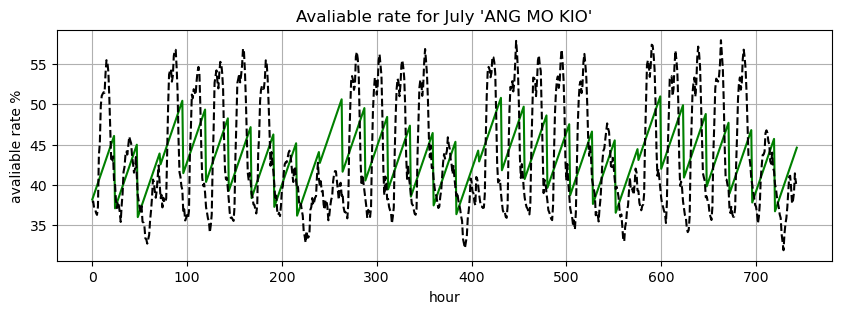

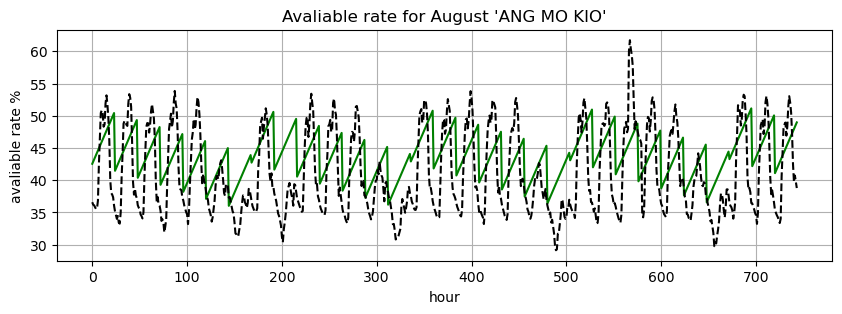

In [5]:
# Linear Regressor

# Standardize the data set
sc = StandardScaler()
sc.fit(july_x)
# not put X here because that will see the test set
july_x_std = sc.transform(july_x)
aug_x_std = sc.transform(aug_x)

july_y = average_area_july.loc[average_area_july['area'] == 10]\
       .drop(average_area_july.columns[[0]],axis=1).values[0]*100

lr = lm.LinearRegression()
lr.fit(july_x_std,july_y)

july_predict = lr.predict(july_x_std)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), july_predict, '-g')
ax.plot(range(0,31*24), july_y, '--k', ms=1)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Avaliable rate for July 'ANG MO KIO'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()



aug_predict = lr.predict(aug_x_std)

aug_y = average_area_aug.loc[average_area_aug['area'] == 10]\
       .drop(average_area_aug.columns[[0]],axis=1).values[0]*100

print('LR prediction:')
print(f'r2 score: {r2_score(aug_y,aug_predict)}')
print(f'mean absolute error: {mean_absolute_error(aug_y,aug_predict)/100}')

fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), aug_predict, '-g')
ax.plot(range(0,31*24), aug_y, '--k', ms=1)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Avaliable rate for August 'ANG MO KIO'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()

SVR prediction:
r2 score: 0.7544175775630498
mean absolute error: 0.020245200615238556


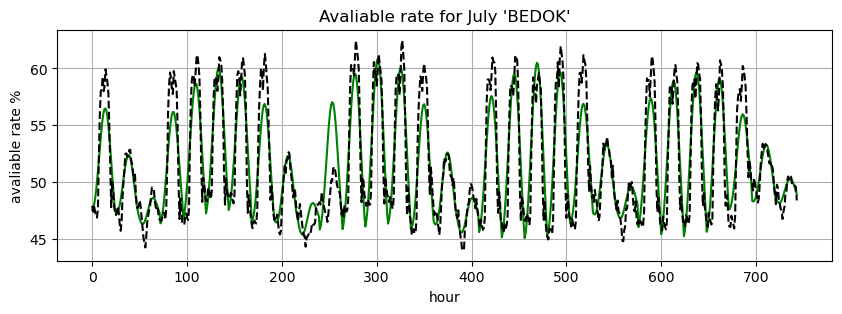

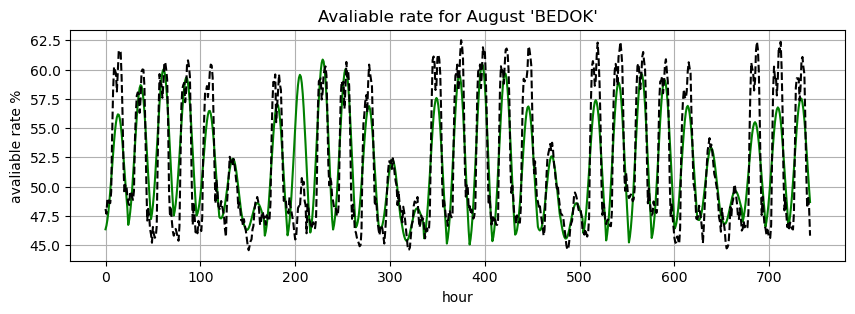

In [6]:
# SVR

# Standardize the data set
sc = StandardScaler()
sc.fit(july_x)
# not put X here because that will see the test set
july_x_std = sc.transform(july_x)
aug_x_std = sc.transform(aug_x)

july_y = average_area_july.loc[average_area_july['area'] == 20]\
       .drop(average_area_july.columns[[0]],axis=1).values[0]*100

svr = SVR(kernel='rbf',gamma='scale',degree = 5,C=0.8)
svr.fit(july_x_std,july_y)

july_predict = svr.predict(july_x_std)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), july_predict, '-g')
ax.plot(range(0,31*24), july_y, '--k', ms=1)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Avaliable rate for July 'BEDOK'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()


aug_predict = svr.predict(aug_x_std)

aug_y = average_area_aug.loc[average_area_aug['area'] == 20]\
       .drop(average_area_aug.columns[[0]],axis=1).values[0]*100

print('SVR prediction:')
print(f'r2 score: {r2_score(aug_y,aug_predict)}')
print(f'mean absolute error: {mean_absolute_error(aug_y,aug_predict)/100}')

fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), aug_predict, '-g')
ax.plot(range(0,31*24), aug_y, '--k', ms=1)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Avaliable rate for August 'BEDOK'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()

DT prediction:
r2 score: 0.8863694781100903
mean absolute error: 0.012246082633674162


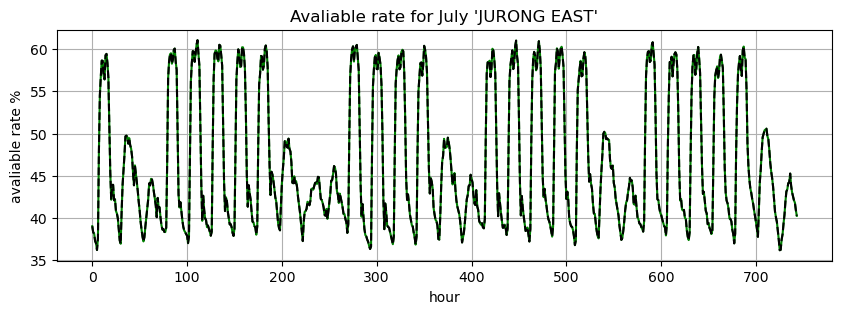

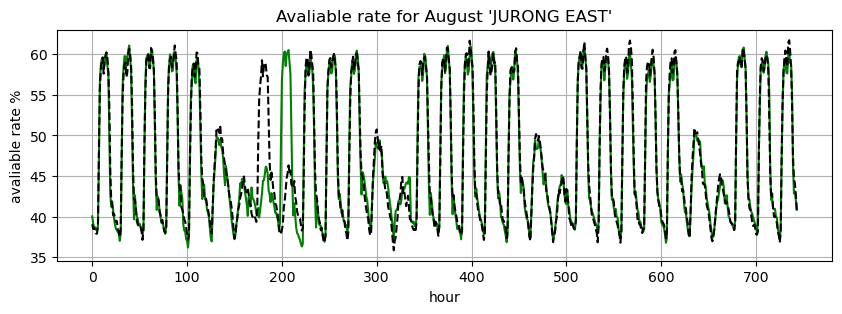

In [7]:
# DT

july_y = average_area_july.loc[average_area_july['area'] == 80]\
       .drop(average_area_july.columns[[0]],axis=1).values[0]*100

dtr = DecisionTreeRegressor()
dtr.fit(july_x,july_y)

july_predict = dtr.predict(july_x)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), july_predict, '-g')
ax.plot(range(0,31*24), july_y, '--k', ms=1)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Avaliable rate for July 'JURONG EAST'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()


aug_predict = dtr.predict(aug_x)

aug_y = average_area_aug.loc[average_area_aug['area'] == 80]\
       .drop(average_area_aug.columns[[0]],axis=1).values[0]*100

print('DT prediction:')
print(f'r2 score: {r2_score(aug_y,aug_predict)}')
print(f'mean absolute error: {mean_absolute_error(aug_y,aug_predict)/100}')

fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), aug_predict, '-g')
ax.plot(range(0,31*24), aug_y, '--k', ms=1)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Avaliable rate for August 'JURONG EAST'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()

DT prediction:
r2 score: 0.8863694781100903
mean absolute error: 0.012246082633674162


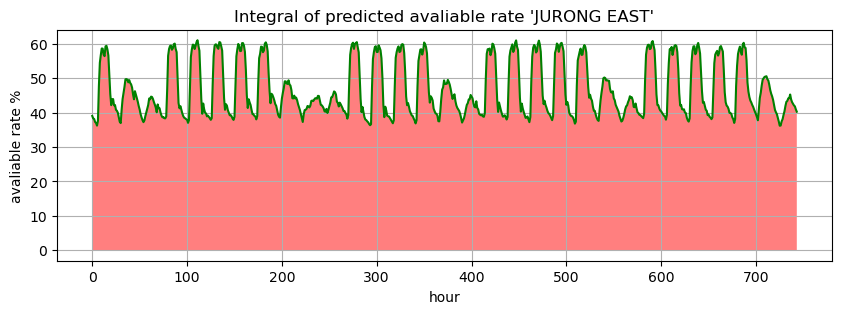

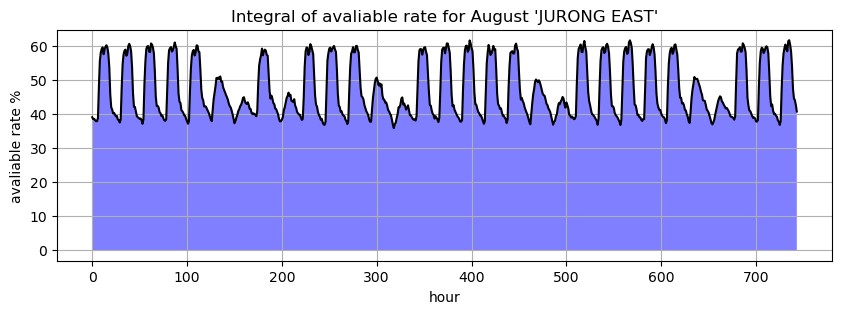

In [11]:
# DT

july_y = average_area_july.loc[average_area_july['area'] == 80]\
       .drop(average_area_july.columns[[0]],axis=1).values[0]*100

dtr = DecisionTreeRegressor()
dtr.fit(july_x,july_y)

july_predict = dtr.predict(july_x)

# Plot
fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), july_predict, '-g')
ax.fill_between(range(0,31*24), y1=july_predict, facecolor='red', alpha=0.5)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Integral of predicted avaliable rate 'JURONG EAST'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()


aug_predict = dtr.predict(aug_x)

aug_y = average_area_aug.loc[average_area_aug['area'] == 80]\
       .drop(average_area_aug.columns[[0]],axis=1).values[0]*100

print('DT prediction:')
print(f'r2 score: {r2_score(aug_y,aug_predict)}')
print(f'mean absolute error: {mean_absolute_error(aug_y,aug_predict)/100}')

fig, ax = plt.subplots(1, 1, figsize=(10, 3))
ax.plot(range(0,31*24), aug_y, '-k', ms=1)
ax.fill_between(range(0,31*24), y1=aug_y, facecolor='blue', alpha=0.5)
#ax.set_xlim(0, 31*24)
#ax.set_ylim(0, 1)
ax.set_title("Integral of avaliable rate for August 'JURONG EAST'")
plt.xlabel("hour")
plt.ylabel("avaliable rate %")
plt.grid()

### The above results show that we can classify the parking lots into areas, and predict the acailability of each area.

**LR prediction:**

r2 score: 

mean absolute error: 

**SVR prediction:**

r2 score: 

mean absolute error: 

**DT prediction:**

r2 score: 

mean absolute error: 

### Then we evaluate the avaliblity of every area by calculating the integration of the avaliable rate curve using model DT

In [25]:
def shortlevel(model,real,time):
    prediction = model.predict(time)
    pshortage = sum(prediction) / 31 /100
    rshortage = sum(real) / 31 /100
    return pshortage, rshortage

In [61]:
def shortmap():
    # using DT to calculate
    july_shortage,aug_shortage,pre_shortage = [],[],[]
    for i in july_div_area['area'].unique().astype(int): 

        july_y = average_area_july.loc[average_area_july['area'] == i]\
               .drop(average_area_july.columns[[0]],axis=1).values[0]*100

        dtr = DecisionTreeRegressor()
        dtr.fit(july_x,july_y)
        aug_predict = dtr.predict(aug_x)
        aug_y = average_area_aug.loc[average_area_aug['area'] == i]\
               .drop(average_area_aug.columns[[0]],axis=1).values[0]*100
        
        # calculate the shortlevel
        pre_s,aug_s = shortlevel(dtr,aug_y,aug_x)
        july_s = sum(july_y) / 31 /100
        july_shortage.append(july_s)
        aug_shortage.append(aug_s)
        pre_shortage.append(pre_s)
        
    return pre_shortage,july_shortage,aug_shortage

In [60]:
def normalize(data):
    avg = np.mean(data)
    mx = max(data)
    mn = min(data)
    return [(i - avg)/(mx - mn) for i in data]

In [63]:
sp,s7,s8 = shortmap()
portid = [i for i in july_div_area['area'].unique().astype(int)]
sortp = np.argsort(sp)
sort7 = np.argsort(s7)
sort8 = np.argsort(s8)
labelp = np.zeros(len(sp))
label7 = np.zeros(len(s7))
label8 = np.zeros(len(s8))
labelp[sortp[:3]] = np.ones(3)
label7[sort7[:3]] = np.ones(3)
label8[sort8[:3]] = np.ones(3)
labelp[sortp[-3:]] = -np.ones(3)
label7[sort7[-3:]] = -np.ones(3)
label8[sort8[-3:]] = -np.ones(3)


In [48]:
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        plt.text(rect.get_x()+rect.get_width()/2., 1.03*height, '%s' % float(height))

Need to build more park in :
44
62
101


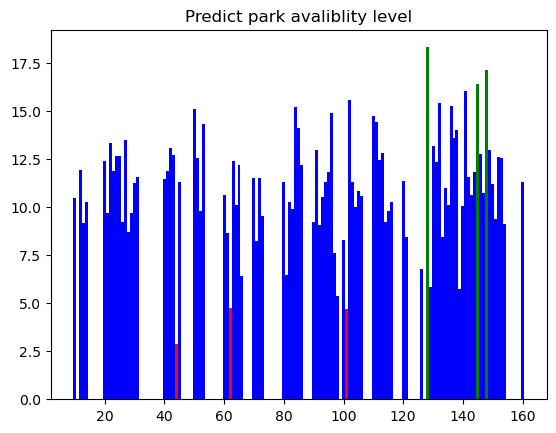

In [64]:
fig1 = plt.figure(2)
print('Need to build more park in :')
for i in range(len(s7)):
    Id = portid[i]
    shortage = sp[i]
    l = labelp[i]
    if l == 0:
        rects = plt.bar(Id,shortage,color=('b'),width = 1,align="center",yerr=0.000001)
    elif l == -1 :
        rects = plt.bar(Id,shortage,color=('g'),width = 1,align="center",yerr=0.000001)
    elif l == 1 :
        rects = plt.bar(Id,shortage,color=('r'),width = 1,align="center",yerr=0.000001)
        print(Id)
#     autolabel(rects)
    
plt.title('Predict park avaliblity level')
plt.show()

Need to build more park in :
44
62
101


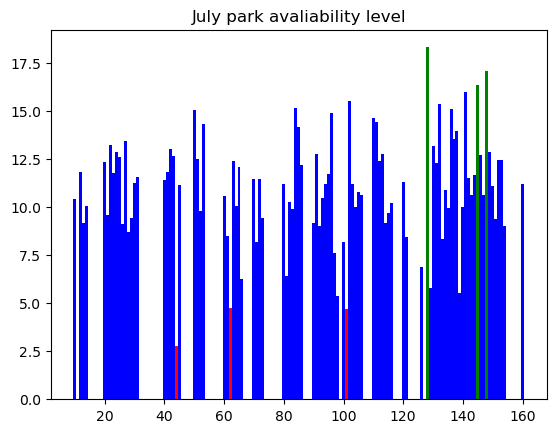

In [66]:
fig1 = plt.figure(2)
print('Need to build more park in :')
for i in range(len(s7)):
    Id = portid[i]
    shortage = s7[i]
    l = label7[i]
    if l == 0:
        rects = plt.bar(Id,shortage,color=('b'),width = 1,align="center",yerr=0.000001)
    elif l == -1 :
        rects = plt.bar(Id,shortage,color=('g'),width = 1,align="center",yerr=0.000001)
    elif l == 1 :
        rects = plt.bar(Id,shortage,color=('r'),width = 1,align="center",yerr=0.000001)
        print(Id)
#     autolabel(rects)
    
plt.title('July park avaliability level')
plt.show()

Need to build more park in :
44
62
101


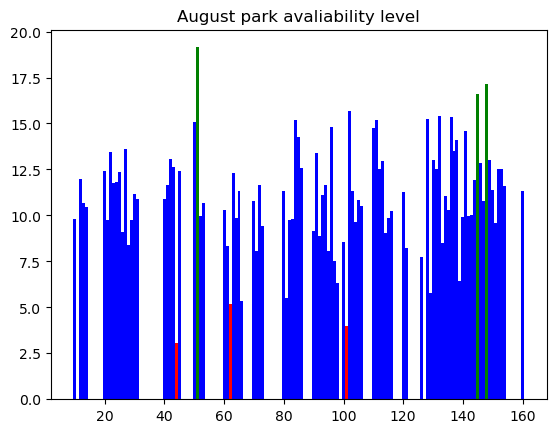

In [58]:
fig1 = plt.figure(2)
print('Need to build more park in :')
for i in range(len(s7)):
    Id = portid[i]
    shortage = s8[i]
    l = label8[i]
    if l == 0:
        rects = plt.bar(Id,shortage,color=('b'),width = 1,align="center",yerr=0.000001)
    elif l == -1 :
        rects = plt.bar(Id,shortage,color=('g'),width = 1,align="center",yerr=0.000001)
    elif l == 1 :
        rects = plt.bar(Id,shortage,color=('r'),width = 1,align="center",yerr=0.000001)
        print(Id)
#     autolabel(rects)
    
plt.title('August park avaliability level')
plt.show()

### 44 refers to the parks near Beach Road, 62 refers to Everton, 101 refers to Mei Lin St. These 3 area need new parks most

## 3.2 two ways to predict the availability of a parking lot, firstly, we may only use the data of this particular parking lot; secondly, we may use the data of the parking lots in the near area.

## We use carpark A100 in area10,  carpark BA1 in area 21 and  carpark H4 in area 70 to demonstrate the prediction of availability of a particular parking lot.

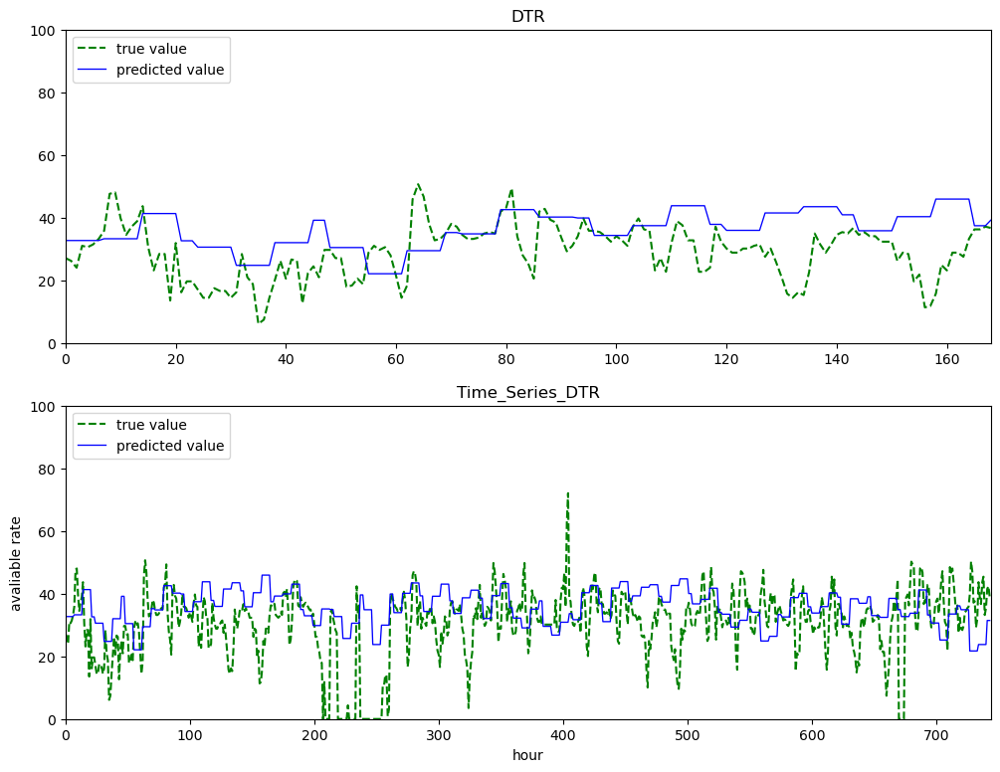

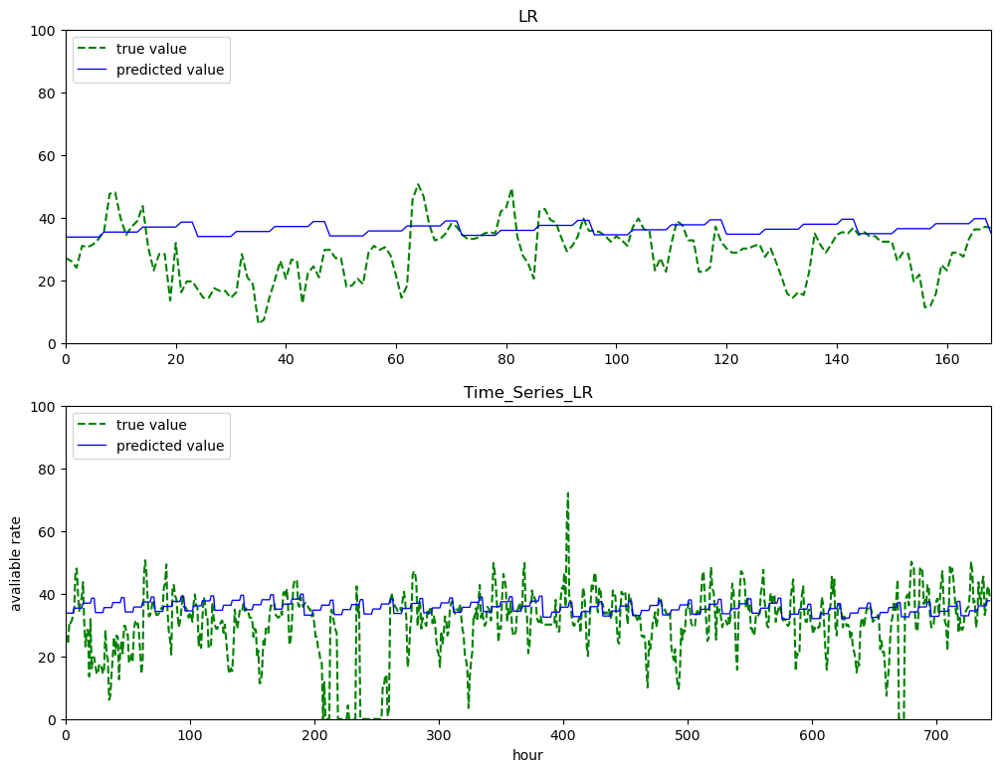

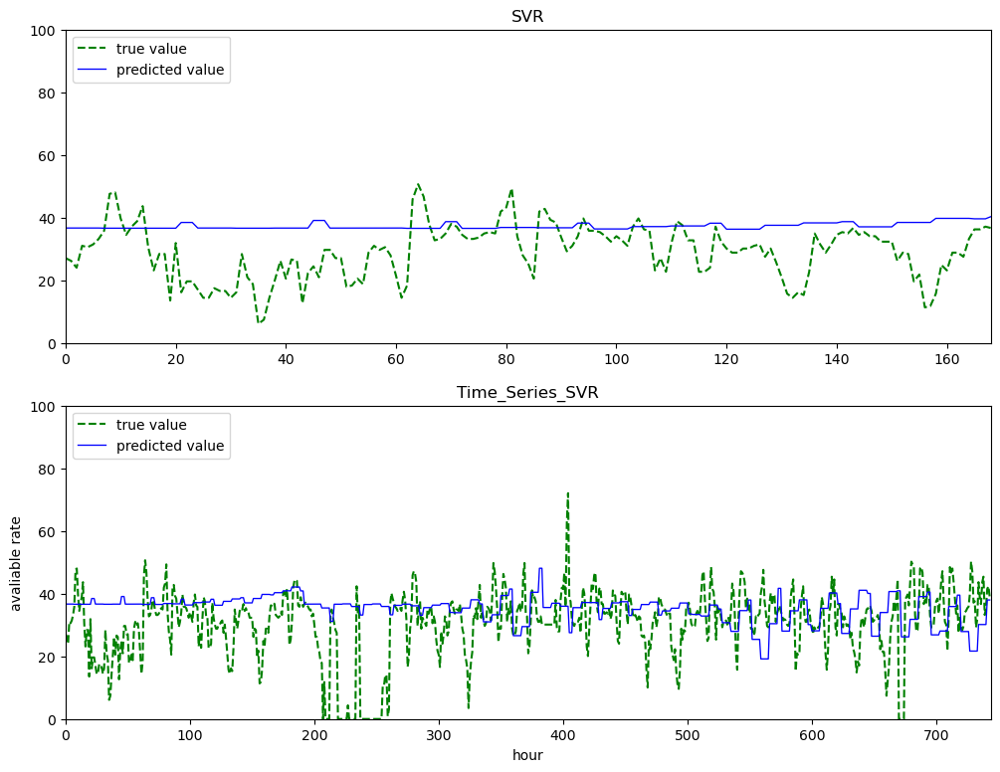

In [7]:
def preprocess(carpark_number):
    july_y = pd.read_csv("july_div_area.csv")
    july_y = july_y.loc[july_y['carpark_number']==carpark_number]
    july_y = july_y.drop(july_y.columns[[0,1,2]],axis=1)
    july_y = july_y.sum()
    
    aug_y = pd.read_csv("aug_div_area.csv")
    aug_y = aug_y.loc[aug_y['carpark_number']==carpark_number]
    aug_y = aug_y.drop(aug_y.columns[[0,1,2]],axis=1)
    aug_y = aug_y.sum()

    hour = [0,1,2]
    day = [0,1,2,3,4,5,6]
    week = [0,1,2,3]
    
    train_x = []
    train_y = []
    test_x = []
    test_y = []
    for i in range(744):
        h = int((i%24)/7) + 1
        day = int((i%192)/24) + 1
        week = int((i%768)/192) + 1
    
        train_x.append([h,day,week])
        train_y.append([july_y[i]])
        test_x.append([h,day,week])
        test_y.append(aug_y[i])
        
    train_x = np.array(train_x)
    train_y = np.array(train_y)   
    test_x = np.array(test_x)
    test_y = np.array(test_y)   
    
    return train_x,train_y,test_x,test_y

#Choose the carpark to be predicted

# train_x, train_y, test_x, test_y = preprocess('A100')
# train_x, train_y, test_x, test_y = preprocess('BA1')
train_x, train_y, test_x, test_y = preprocess('H17')



dtr = DecisionTreeRegressor()
lr = lm.LinearRegression()
svr = SVR(kernel='poly',gamma='scale',degree = 6,C=0.9)

svr.fit(train_x,train_y)
dtr.fit(train_x,train_y)
lr.fit(train_x,train_y)

test_y_dtr = dtr.predict(test_x)
test_y_lr = lr.predict(test_x)
test_y_svr = svr.predict(test_x)

#Plot the result of DT
fig, axs = plt.subplots(2, 1, figsize=(12, 9))
axs[0].plot(range(0,744), test_y*100, '--g',label = 'true value')
axs[0].plot(range(0,744), test_y_dtr*100, 'b-', ms=1,linewidth=0.95,label='predicted value')
axs[0].set_xlim(0, 7*24)
axs[0].set_ylim(0, 100)
axs[0].set_title("DTR")
axs[0].legend(loc=2)
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()

axs[1].plot(range(0,744), test_y*100, '--g',label = 'true value')
axs[1].plot(range(0,744), test_y_dtr*100, 'b-', ms=1,linewidth=0.95,label='predicted value')
axs[1].set_xlim(0, 24*31)
axs[1].set_ylim(0, 100)
axs[1].set_title("Time_Series_DTR")
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()
plt.legend(loc='upper left')


#Plot the result of LR
fig, axs = plt.subplots(2, 1, figsize=(12, 9))
axs[0].plot(range(0,744), test_y*100, '--g',label = 'true value')
axs[0].plot(range(0,744), test_y_lr*100, 'b-', ms=1,linewidth=0.95,label='predicted value')
axs[0].set_xlim(0, 7*24)
axs[0].set_ylim(0, 100)
axs[0].set_title("LR")
axs[0].legend(loc=2)
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()

axs[1].plot(range(0,744), test_y*100, '--g',label = 'true value')
axs[1].plot(range(0,744), test_y_lr*100, 'b-', ms=1,linewidth=0.95,label='predicted value')
axs[1].set_xlim(0, 24*31)
axs[1].set_ylim(0, 100)
axs[1].set_title("Time_Series_LR")
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()
plt.legend(loc='upper left')

#Plot the result of SVR
fig, axs = plt.subplots(2, 1, figsize=(12, 9))
axs[0].plot(range(0,744), test_y*100, '--g',label = 'true value')
axs[0].plot(range(0,744), test_y_svr*100, 'b-', ms=1,linewidth=0.95,label='predicted value')
axs[0].set_xlim(0, 7*24)
axs[0].set_ylim(0, 100)
axs[0].set_title("SVR")
axs[0].legend(loc=2)
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()

axs[1].plot(range(0,744), test_y*100, '--g',label = 'true value')
axs[1].plot(range(0,744), test_y_svr*100, 'b-', ms=1,linewidth=0.95,label='predicted value')
axs[1].set_xlim(0, 24*31)
axs[1].set_ylim(0, 100)
axs[1].set_title("Time_Series_SVR")
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()
plt.legend(loc='upper left')




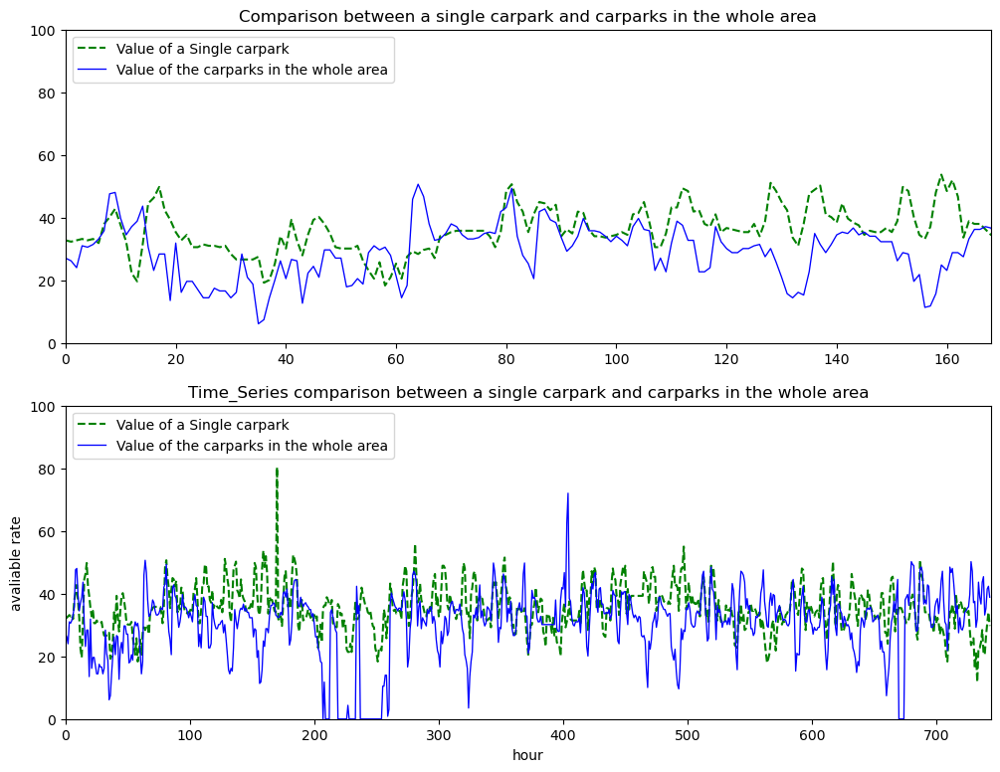

In [8]:
def area_preprocess(area_number,carpark_number):
    #Get the average rate of the whole area
    whole_area_y = pd.read_csv("july_div_area.csv")
    whole_area_y = whole_area_y.loc[whole_area_y['area']==area_number]
    whole_area_y = whole_area_y.drop(whole_area_y.columns[[0,1,2]],axis=1)
    park_num = len(whole_area_y)
    whole_area_y = whole_area_y.sum()
    whole_area_y = whole_area_y.div(park_num)
    
    single_y = pd.read_csv("july_div_area.csv")
    single_y = single_y.loc[single_y['carpark_number']==carpark_number]
    single_y = single_y.drop(single_y.columns[[0,1,2]],axis=1)
    single_y = single_y.sum()
    
    
    whole_area = []
    single = []
    
    for i in range(744):
        whole_area.append([whole_area_y[i]])
        single.append(single_y[i])
        
    whole_area = np.array(train_y)   
    single = np.array(test_y)
    
    return whole_area, single

#Choose the carpark and area using the parameter
whole_area__y,single_y = area_preprocess(10,'A100')

#Show the difference between a single carpark and the carparks in the whole area
fig, axs = plt.subplots(2, 1, figsize=(12, 9))
axs[0].plot(range(0,744), train_y*100, '--g',label = 'Value of a Single carpark')
axs[0].plot(range(0,744), test_y*100, 'b-', ms=1,linewidth=0.95,label='Value of the carparks in the whole area')
axs[0].set_xlim(0, 7*24)
axs[0].set_ylim(0, 100)
axs[0].set_title("Comparison between a single carpark and carparks in the whole area")
axs[0].legend(loc=2)
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()

#The comparison within the whole time series
axs[1].plot(range(0,744), train_y*100, '--g',label = 'Value of a Single carpark')
axs[1].plot(range(0,744), test_y*100, 'b-', ms=1,linewidth=0.95,label='Value of the carparks in the whole area')
axs[1].set_xlim(0, 24*31)
axs[1].set_ylim(0, 100)
axs[1].set_title("Time_Series comparison between a single carpark and carparks in the whole area")
plt.xlabel("hour")
plt.ylabel("avaliable rate")
plt.grid()
plt.legend(loc='upper left')


### As we can see, the difference between the rate of a particular carpark and the rate of carparks in the whole area is quite great, so we believe it's not appropriate to predict the availablility of a particular carpark using the rate data of the whole area.

## 3.3 We can use the dataset to give drivers the real-time information of nearby parking lots and suggest them with the best alternative parking lot.

In [7]:
#concatenate the July and August Data
july_data=pd.read_csv('./july_div_area.csv')
aug_data=pd.read_csv('./aug_div_area.csv')
aug_data.drop(['area','carpark_number'],axis=1,inplace=True)
july_aug_data=pd.concat((july_data,aug_data),axis=1)

july_aug_data.drop(['Unnamed: 0'],axis=1,inplace=True)

columns_length=len(list(july_aug_data.columns))-2

#Labelize the column: data[carpark_number]
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
july_aug_data['carpark_number'] = le.fit_transform(july_aug_data['carpark_number'])

#convert pd to np
data=np.array(july_aug_data)  

In [8]:
from sklearn.linear_model import LinearRegression as LR
from sklearn.tree import DecisionTreeRegressor as DTR
from sklearn.preprocessing import LabelEncoder

time_=list(july_aug_data.columns)
import time
from datetime import datetime


#decode the time to get the array
def time_process(time_str):
    valid_time_str=time_str[5:-2]
    valid_time_str=valid_time_str.split('_')
    decode_time_list=[]
    for i in valid_time_str:
        decode_time_list.append(int(i))
    return decode_time_list
    
        
        

for i in range(2,len(time_)):
    time_[i]=time_process(time_[i])


#show the total_time
time__=time_[2:-1]
# print(time__)




In [9]:
#  use the July data and the data before the test day as training data to simulate the available rate at the specific parking lot at test date.

def gui(carpark_number,date_time,threshold=0.6):
    
    carpark_number_=np.array([carpark_number])
    carpark_number_=le.transform(carpark_number_) #transform to the Lablel Encoder form
    #find the carpark_number belongs to which area
    area_number=0
    for i in range(len(july_aug_data)):
        if (july_aug_data.iloc[i,1])==carpark_number_:
            area_number=int(july_aug_data.iloc[i,0])
#             print(area_number)
            break

    
    date_time_list=time_process(date_time) #[month,day,hour,min]
#     print(date_time_list)
    time_index=0
    for j in range(len(time__)):
        if date_time_list[0] == time__[j][0]:#year
            if date_time_list[1]==time__[j][1]:#month
                if date_time_list[2]==time__[j][2]:#day
                    if date_time_list[3]<=time__[j][3]:#hour
                        time_index=j-1
                    elif date_time_list[3]>time__[j][3]:
                        time_index=j
    
#  params: train_x: carpark_number and time
#  params: train_y: available rate

    train_x=[]
    train_y=[]
    for i in range(len(data)):
        for j in range(2,time_index+3):
            tmp=[]
            tmp.append(data[i][1])#car_number
            tmp+=(time__[j])#add time
#             print(tmp)
            train_x.append(tmp) #(car_number,year,month,day,hour)
            train_y.append(data[i,j])
        
    train_x=np.array(train_x).reshape(len(train_x),5) #[len(data)*len(time_idx),(car_number,year,month,day,hour)]
    train_y=np.array(train_y) #[len(data)*len(time_idx),1]
    
    print('train_x.shape: ',train_x.shape)
    print('train_y.shape: ',train_y.shape)

    
#     print('x1',x1)
    x2=date_time_list
    x_predict=[]
    x_predict+=list(carpark_number_)
    x_predict+=x2
#     print('x_predict',x_predict)
    
    x_predic_=np.array(x_predict).reshape(1,len(x_predict)) #[1,5]
#     print(x_predic_.shape)
    #start training
    reg = DTR().fit(train_x, train_y)
    
#     print(x_predic.shape)
    res_rate=reg.predict(x_predic_)
#     print(reg.score(0.342629482071713,res_rate))
#     print(res_rate)
    if res_rate>=threshold:
        print('the available rate of the parking lot：{}'.format(res_rate[0]))
        print("there are enough parking lots, you can go!")
    else:
        print("the parking lots is a little crowded, the available rate now is :{}".format(res_rate[0]))
         #return two possible parking lots nearby where the available rate are above 60%
        res=[]
        res_rate_list=[]
        #search how many parking lots in the area of area_number，and predict the free parking lots
        for i in range(len(july_aug_data)):
            if july_aug_data.iloc[i,0]==area_number:
#                 print(july_aug_data.iloc[i,0])
                x1=july_aug_data.iloc[i,1]
                x2=date_time_list
                x_predict=[]
                x_predict.append(x1)
                x_predict+=x2
#                 print(x_predict)
                x_predic_=np.array(x_predict).reshape(1,len(x_predict))
                res_rate=reg.predict(x_predic_)
#                 print(res_rate)
                if res_rate>=threshold:
                    res_rate_list.append(res_rate)
                    res.append(july_aug_data.iloc[i,1])
                
        if len(res)>=2:

            print('In your destination Area:{x},recommend the nearby parking lots {y} and {z} to park,{y} parking lot  has available rate: {y1},\n{z} parking lot has available rate:{z1}'.format(x=area_number,y=le.inverse_transform(np.array([res[0]]))[0],z=le.inverse_transform(np.array([res[1]]))[0],y1=res_rate_list[0][0],z1=res_rate_list[1][0]))   

In [13]:
def select_parklot():
    
    print('the car park lots list is shown as below:')
    display(july_data['carpark_number'].values)
    lot = str(input('please select the parking lot you wanna go, like A10:  '))
    while True:
        
        if not lot in july_data['carpark_number'].values:
            lot = str(input('the parking lot doesn\'t exist, please reinput: '))
        else:
            break
        
    day,hour = input('please choose the day of August you want to depature:  '),input('please choose the hour you may arrive in the day: ')
    date_time  = f'2022_8_{day}_{hour}_20_0'
    gui(lot,date_time,threshold=0.6)
    
    
    

In [14]:
select_parklot()

the car park lots list is shown as below:


array(['A10', 'A100', 'A11', 'A12', 'A13', 'A15', 'A2', 'A20', 'A21',
       'A24', 'A25', 'A26', 'A27', 'A28', 'A29', 'A30', 'A31', 'A33',
       'A34', 'A35', 'A36', 'A37', 'A38', 'A39', 'A4', 'A40', 'A41',
       'A42', 'A43', 'A44', 'A45', 'A47', 'A48', 'A49', 'A50', 'A51',
       'A52', 'A53', 'A54', 'A59', 'A60', 'A61', 'A63', 'A64', 'A65',
       'A66', 'A67', 'A68', 'A69', 'A7', 'A70', 'A71', 'A72', 'A73',
       'A74', 'A75', 'A76', 'A77', 'A78', 'A8', 'A81', 'A82', 'A85',
       'A87', 'A88', 'A9', 'A94', 'A98', 'ACB', 'ACM', 'AH1', 'ALL',
       'AM14', 'AM16', 'AM18', 'AM19', 'AM20', 'AM22', 'AM32', 'AM43',
       'AM46', 'AM51', 'AM64', 'AM79', 'AM80', 'AM81', 'AM96', 'AR1L',
       'AR1M', 'AR2L', 'AR2M', 'AR5M', 'AR7L', 'AR7M', 'AR9', 'AV1',
       'B10', 'B10M', 'B11', 'B14', 'B16', 'B17', 'B19', 'B20', 'B21',
       'B23M', 'B23T', 'B24', 'B25', 'B26', 'B27', 'B28', 'B30', 'B31',
       'B32', 'B33', 'B34', 'B35', 'B40', 'B41', 'B42', 'B43', 'B44',
       'B44B', 'B45'

please select the parking lot you wanna go, like A10:  W77
please choose the day of August you want to depature:  3
please choose the hour you may arrive in the day: 4
train_x.shape:  (1563344, 5)
train_y.shape:  (1563344,)
the parking lots is a little crowded, the available rate now is :0.4329896907216495
In your destination Area:153,recommend the nearby parking lots W101 and W104 to park,W101 parking lot  has available rate: 0.6172839506172839,
W104 parking lot has available rate:0.6451149425287356
